## Importing libraries

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from tqdm import tqdm

tqdm.pandas()

# Importing dataset and Data Preprocessing with roberta obtained sentiments from previous file

In [4]:
data = pd.read_csv("roberta_sentiment_processed.csv")
data.head()

,Unnamed: 0,Id,drugName,condition,review,rating,date,usefulCount,ratingSentimentLabel,cleanReview,roberta_sentiment
0,0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combinati...",9.0,"May 20, 2012",27,positive,It side effect I take combination Bystolic 5 M...,neutral
1,1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of ...",8.0,"April 27, 2010",192,positive,My son halfway fourth week Intuniv We became c...,neutral
2,2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, wh...",5.0,"December 14, 2009",17,neutral,I used take another oral contraceptive 21 pill...,negative
3,3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth...",8.0,"November 3, 2015",10,positive,This first time using form birth control I039m...,positive
4,4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around...",9.0,"November 27, 2016",37,positive,Suboxone completely turned life around I feel ...,positive


In [5]:
# Converting sentiment labels to integers
label_encoder = LabelEncoder()
data['roberta_sentiment_label'] = label_encoder.fit_transform(data['roberta_sentiment'])

In [6]:
# Working with just two columns reviews and roberta sentiments as labels for sentiment analysis
data = data[['cleanReview', 'roberta_sentiment_label']]
data.shape

(213706, 2)

In [7]:
# Removing Null values
data.isnull().sum()
data.dropna(inplace=True)
data.isnull().sum()
data.shape

(213704, 2)

# Removing Stopwords

In [8]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stopwords = stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/mariarajbhandari/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [9]:
data['cleanReview'] = data['cleanReview'].progress_apply(lambda x: ' '.join([item for item in x.split() if item not in stopwords]))

100%|██████████| 213704/213704 [00:25<00:00, 8532.16it/s]


In [10]:
## Removing punctuations

import string

def remove_punctuations(text):
    for punctuation in string.punctuation:
        text = text.replace(punctuation, '')
    return text

# Apply to the DF series
data['cleanReview'] = data['cleanReview'].progress_apply(remove_punctuations)

100%|██████████| 213704/213704 [00:01<00:00, 110621.66it/s]


In [11]:
data['cleanReview']

0         It side effect I take combination Bystolic 5 M...
1         My son halfway fourth week Intuniv We became c...
2         I used take another oral contraceptive 21 pill...
3         This first time using form birth control I039m...
4         Suboxone completely turned life around I feel ...
                                ...                        
213701    I taken Tamoxifen 5 years Side effects severe ...
213702    I039ve taking Lexapro escitaploprgram since Fe...
213703    I039m married 34 years old I kids Taking pill ...
213704    I prescribed Nucynta severe neckshoulder pain ...
213705                                             It works
Name: cleanReview, Length: 213704, dtype: object

In [12]:
## Removing long sentences from the dataframe column reviews to remove few exceptions

import re

def has_long_sentence(text, max_length=1000):
    # Split text into sentences using regex
    sentences = re.split(r'(?<!\w\.\w.)(?<![A-Z][a-z]\.)(?<=\.|\?)\s', text)
    # Check if any sentence exceeds the minimum length
    return any(len(sentence) > max_length for sentence in sentences)

## Removing long sentences from the dataframe column reviews
data = data[~data['cleanReview'].apply(has_long_sentence)]
data.shape

(213704, 2)

# Fine - Tuning BERT Model With Roberta Obtained Sentiment Labels

In [13]:
# Test - Train Splitting of the features
train_df, val_df = train_test_split(data, test_size=0.2, random_state=42)

In [14]:
train_df.shape, val_df.shape

((170963, 2), (42741, 2))

In [15]:
# Load the BERT tokenizer
from transformers import BertTokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Tokenize the data
def tokenize_data(data, tokenizer):
    return tokenizer(
        data['cleanReview'].tolist(),
        add_special_tokens=True,
        max_length=128,
        padding='max_length',
        truncation=True,
        return_attention_mask=True,
        return_tensors='pt'
    )

train_tokens = tokenize_data(train_df, tokenizer)
val_tokens = tokenize_data(val_df, tokenizer)

In [16]:
print(val_tokens)

{'input_ids': tensor([[  101,  2044,  2086,  ...,     0,     0,     0],
        [  101,  1045,  2699,  ...,     0,     0,     0],
        [  101,  1045,  2318,  ...,     0,     0,     0],
        ...,
        [  101,  2318,  2809,  ...,     0,     0,     0],
        [  101,  1045,  2288,  ...,     0,     0,     0],
        [  101,  1045, 18856,  ...,     0,     0,     0]]), 'token_type_ids': tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]]), 'attention_mask': tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0]])}


In [17]:
import torch
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler

# Converting to PyTorch datasets
train_dataset = TensorDataset(train_tokens['input_ids'], train_tokens['attention_mask'], torch.tensor(train_df['roberta_sentiment_label'].values))
val_dataset = TensorDataset(val_tokens['input_ids'], val_tokens['attention_mask'], torch.tensor(val_df['roberta_sentiment_label'].values))

# Creating DataLoaders
train_dataloader = DataLoader(train_dataset, sampler=RandomSampler(train_dataset), batch_size=16)
val_dataloader = DataLoader(val_dataset, sampler=SequentialSampler(val_dataset), batch_size=16)

In [18]:
# Data preprocessing function (including tokenization)
def preprocess_data(text, label):
  encoded_text = tokenizer(text, padding='max_length', truncation=True, return_tensors='tf')
  return encoded_text, label

# Prepare training data
train_data = [(preprocess_data(text, label)) for text, label in zip(data["cleanReview"], data["roberta_sentiment_label"])]

# Train-test split
from sklearn.model_selection import train_test_split
train_encodings, test_encodings, train_labels, test_labels = train_test_split([d[0] for d in train_data], [d[1] for d in train_data], test_size=0.2)

2024-09-10 08:03:13.574460: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [20]:
train_encodings, test_encodings

([{'input_ids': <tf.Tensor: shape=(1, 512), dtype=int32, numpy=
  array([[  101,  2023,  5409,  4319,  1045,  2412,  2579,  2048,  3134,
           2635,  7388, 18370,  5078,  9145,  1045,  6684,  2147,  1045,
           3471,  9524,  2197,  2305,  1045,  2514,  2303,  2009,  8450,
           5808, 13403,  2943,  3798,  2659,  2514,  2066,  1045,  5305,
           1045,  2514,  3147, 14777,  1045,  2196,  2514,  2919,   102,
              0,     0,     0,     0,     0,     0,     0,     0,     0,
              0,     0,     0,     0,     0,     0,     0,     0,     0,
              0,     0,     0,     0,     0,     0,     0,     0,     0,
              0,     0,     0,     0,     0,     0,     0,     0,     0,
              0,     0,     0,     0,     0,     0,     0,     0,     0,
              0,     0,     0,     0,     0,     0,     0,     0,     0,
              0,     0,     0,     0,     0,     0,     0,     0,     0,
              0,     0,     0,     0,     0,     0,     0,  

In [20]:
from transformers import BertForSequenceClassification, AdamW, get_linear_schedule_with_warmup

# Load the BERT model
model = BertForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=3)

# Define the optimizer
optimizer = AdamW(model.parameters(), lr=2e-5, eps=1e-8)

# Number of training epochs
epochs = 3

# Total number of training steps
total_steps = len(train_dataloader) * epochs

# Create the learning rate scheduler
scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=total_steps)

# Set up the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:591: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e

In [21]:
# Function to calculate accuracy
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)

# Lists to store loss and accuracy values for each epoch
train_loss_values = []
val_accuracy_values = []

# Training loop
for epoch in range(epochs):
    model.train()
    total_loss = 0
    for batch in tqdm(train_dataloader):
        b_input_ids, b_input_mask, b_labels = tuple(t.to(device) for t in batch)
        model.zero_grad()
        outputs = model(b_input_ids, attention_mask=b_input_mask, labels=b_labels)
        loss = outputs.loss
        total_loss += loss.item()
        loss.backward()
        optimizer.step()
        scheduler.step()

    avg_train_loss = total_loss / len(train_dataloader)
    train_loss_values.append(avg_train_loss)

    # Validation
    model.eval()
    eval_loss = 0
    eval_accuracy = 0
    nb_eval_steps = 0

    for batch in val_dataloader:
        b_input_ids, b_input_mask, b_labels = tuple(t.to(device) for t in batch)
        with torch.no_grad():
            outputs = model(b_input_ids, attention_mask=b_input_mask)
        logits = outputs.logits
        preds = logits.detach().cpu().numpy()
        label_ids = b_labels.to('cpu').numpy()
        eval_accuracy += flat_accuracy(preds, label_ids)
        nb_eval_steps += 1

    avg_val_accuracy = eval_accuracy / nb_eval_steps
    val_accuracy_values.append(avg_val_accuracy)

    print(f"Epoch {epoch+1}")
    print(f"Training loss: {avg_train_loss}")
    print(f"Validation Accuracy: {avg_val_accuracy}")

100%|██████████| 10686/10686 [59:57<00:00,  2.97it/s]


Epoch 1
Training loss: 0.392194775287177
Validation Accuracy: 0.8795097305389222


100%|██████████| 10686/10686 [59:58<00:00,  2.97it/s]


Epoch 2
Training loss: 0.18519192028498052
Validation Accuracy: 0.921126497005988


100%|██████████| 10686/10686 [59:59<00:00,  2.97it/s]


Epoch 3
Training loss: 0.07215949061481751
Validation Accuracy: 0.9319563997005988


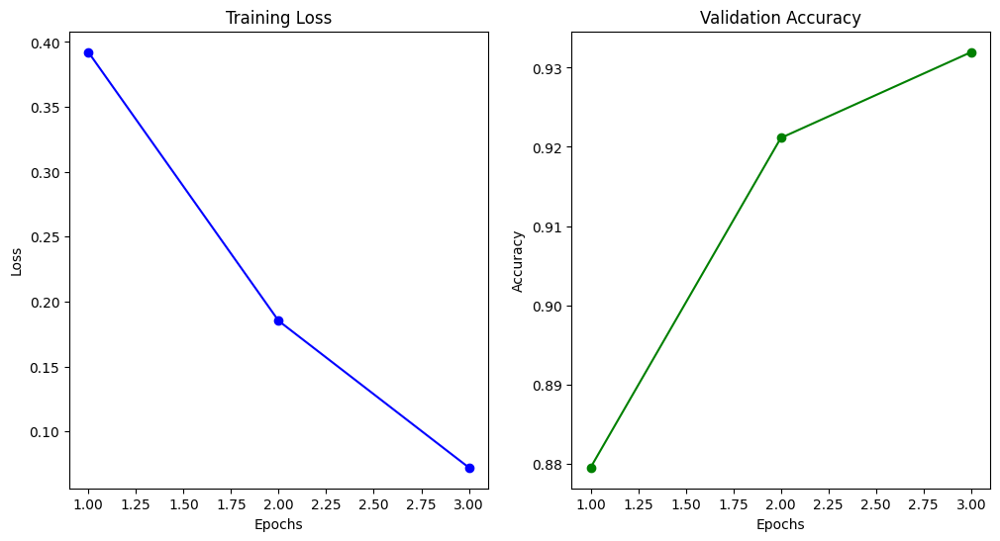

In [22]:
# After training, plotting the loss and accuracy curves
epochs_range = range(1, epochs + 1)

plt.figure(figsize=(12, 6))

# Plot Training Loss
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_loss_values, 'b-o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss')

# Plot Validation Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_accuracy_values, 'g-o')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Validation Accuracy')

plt.show()

## Saving the Model

In [ ]:
# Define the path to save the model
save_directory = "./fine_tuned_bert_model"

# Save the model
model.save_pretrained(save_directory)

# Save the tokenizer
tokenizer.save_pretrained(save_directory)

print(f"Model and tokenizer saved to {save_directory}")

## Loading the saved model

In [1]:
def load_fine_tuned_model(save_directory):
    # Loading the tokenizer
    tokenizer = BertTokenizer.from_pretrained(save_directory)

    # Loading the fine-tuned model for sequence classification
    model = BertForSequenceClassification.from_pretrained(save_directory)

    print(f"Model and tokenizer loaded from {save_directory}")
    
    return model, tokenizer

# Usage example
save_directory = "./fine_tuned_bert_model"
model, tokenizer = load_fine_tuned_model(save_directory)

Model and tokenizer loaded from ./fine_tuned_bert_model


In [2]:
model

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e

In [3]:
tokenizer

BertTokenizer(name_or_path='./fine_tuned_bert_model', vocab_size=30522, model_max_length=512, is_fast=False, padding_side='right', truncation_side='right', special_tokens={'unk_token': '[UNK]', 'sep_token': '[SEP]', 'pad_token': '[PAD]', 'cls_token': '[CLS]', 'mask_token': '[MASK]'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	0: AddedToken("[PAD]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	100: AddedToken("[UNK]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	101: AddedToken("[CLS]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	102: AddedToken("[SEP]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	103: AddedToken("[MASK]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
}

## Evaluating the validation set with the model

In [17]:
# Tokenizing the data
def tokenize_data(data, tokenizer):
    return tokenizer(
        data['cleanReview'].tolist(),
        add_special_tokens=True,
        max_length=128,
        padding='max_length',
        truncation=True,
        return_attention_mask=True,
        return_tensors='pt'
    )

train_tokens = tokenize_data(train_df, tokenizer)
val_tokens = tokenize_data(val_df, tokenizer)

In [19]:
# Evaluation of the BERT model

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, precision_recall_fscore_support
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score

def evaluate_model(model, dataloader):
    model.eval()
    # predictions, true_labels = [], []
    predictions, true_labels, probs = [], [], []

    for batch in dataloader:
        batch = tuple(t.to(device) for t in batch)
        input_ids, attention_mask, labels = batch

        with torch.no_grad():
            outputs = model(input_ids, attention_mask=attention_mask)

        logits = outputs.logits
        predicted_labels = torch.argmax(logits, dim=1).cpu().numpy()
        probabilities = torch.nn.functional.softmax(logits, dim=1).cpu().numpy()  # Get predicted probabilities
        label_ids = labels.cpu().numpy()

        predictions.extend(predicted_labels)
        true_labels.extend(label_ids)
        probs.extend(probabilities)  # Save probabilities

    return predictions, true_labels, probs

# Get predictions and true labels
predictions, true_labels, probs = evaluate_model(model, val_dataloader)

# Calculate evaluation metrics
accuracy = accuracy_score(true_labels, predictions)
precision, recall, f1, _ = precision_recall_fscore_support(true_labels, predictions, average='weighted')

# Classification report
report = classification_report(true_labels, predictions)
print(report)

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     13873
           1       0.97      0.92      0.94     13033
           2       0.96      0.99      0.97     15835

    accuracy                           0.97     42741
   macro avg       0.97      0.96      0.97     42741
weighted avg       0.97      0.97      0.97     42741



In [20]:
# Assuming num_classes is the number of unique labels in the dataset
num_classes = len(set(true_labels))
true_labels_bin = label_binarize(true_labels, classes=range(num_classes))

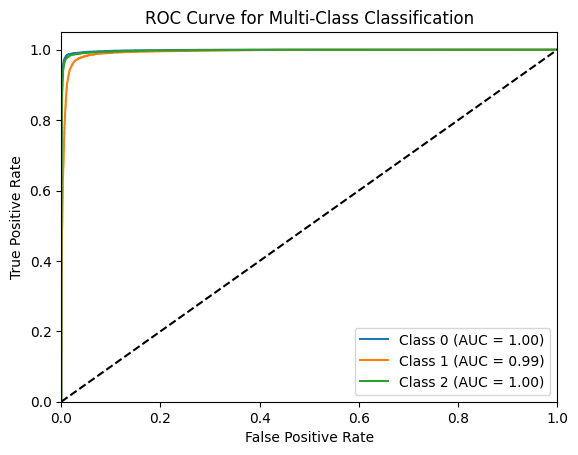

In [21]:
# Binarize the true labels for multi-class classification
true_labels_bin = label_binarize(true_labels, classes=range(num_classes))

# Compute ROC curve and ROC AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(true_labels_bin[:, i], [p[i] for p in probs])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure()
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line for random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multi-Class Classification')
plt.legend(loc='lower right')
plt.show()

## Prediction of the Model with few Examples reviews

In [22]:
def predict_sentiment(text, model, tokenizer, device):
    # Tokenize the input text
    inputs = tokenizer(
        text,
        add_special_tokens=True,  # Adds `[CLS]` and `[SEP]`
        max_length=128,  # Max length of the input sequence
        padding='max_length',  # Pads to max length
        truncation=True,  # Truncates longer sequences
        return_attention_mask=True,  # Generates attention mask
        return_tensors='pt'  # Returns PyTorch tensors
    )
    
    # Moving input to the correct device
    input_ids = inputs['input_ids'].to(device)
    attention_mask = inputs['attention_mask'].to(device)

    # Set the model to evaluation mode and disable gradient computation
    model.eval()
    with torch.no_grad():
        # Get the model's output (logits)
        outputs = model(input_ids, attention_mask=attention_mask)
        logits = outputs.logits

    # Get the predicted sentiment class
    predicted_class = torch.argmax(logits, dim=1).cpu().item()

    # Defining sentiment labels: 0 -> Neutral, 1 -> Negative, 2 -> Positive
    sentiment_labels = {0: 'Neutral', 1: 'Negative', 2: 'Positive'}
    predicted_sentiment = sentiment_labels[predicted_class]
    
    return predicted_sentiment

In [23]:
# Example 1 - Positive
test_sentence = "It has no side effects, I take it in combination of Bystolic 5 Mg and Fish Oil."

# Test the sentiment prediction
predicted_sentiment = predict_sentiment(test_sentence, model, tokenizer, device)
print(f"Predicted sentiment for the example: {predicted_sentiment}")

Predicted sentiment for the example: Positive


In [24]:
# Example 2 - Neutral
test_sentence = "I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."

# Test the sentiment prediction
predicted_sentiment = predict_sentiment(test_sentence, model, tokenizer, device)
print(f"Predicted sentiment for the example: {predicted_sentiment}")

Predicted sentiment for the example: Neutral
